In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as st
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
headers = ["Пациент", "Дата_операции", "Начало_периода", "Конец_периода",
          "Госпитальная_летальность", "TND_Соматогенный_психоз", "PND_Пароксизмальная_ночная_одышка",
          "Продленное_ИВЛ", "Заместительная_почечная_терапия", "Кровотечение", "Инфаркт_миокарда",
          "Синдром_полиорганной_недостаточности", "Возраст", "Пол", "Рост", "Вес", "ИМТ", "BSA",
          "ВПС", "АГ", "ИБС", "Инфаркт_миокарада_в_анамнезе", "Нарушения_мозгового_кровообращения_в_анамнезе",
          "ХОБЛ", "Синдром_Марфана", "Атеросклероз_аорты", "Гемоглобин_лаб", "Гематокрит_лаб", "Мочевина_лаб", "Креатинин_лаб", "СКФ_лаб",
          "Стеноз_ПКА", "Стеноз_стЛКА", "Стеноз_ПНА", "Стеноз_ВТК", "Стеноз_ВСА_слева", "Стеноз_ВСА_справа", "ФВ",
          "Стеноз_АоК", "Недостаточность_АоК", "Стеноз_МК", "Недостаточность_МК", "Cинусы_Вальсальвы", "ВоА", "Дуга",
          "Сегмент_А", "Сегмент_В", "Сегмент_С", "Проксимальная_фенестрация_СТС", "Проксимальная_фенестрация_ВоА",
          "Проксимальная_фенестрация_Дуга", "Проксимальная_фенестрация_за_ЛПА", "Ретроградная_диссекция",
          "Протяженность_расслоения_ВоА", "Протяженность_расслоения_Дуга", "Протяженность_расслоения_нисхАо",
          "Протяженность_расслоения_брюшАо", "Протяженность_расслоения_подздош_бедр", "Время_ИК", "Окклюзия_аорты", "АПГМ", "ЦА",
          "Глубокая_гипотермия", "Умеренная_гипотермия", "Рестернотомия", "Продолжительность_операции",
          "Эрмасса", "СЗП", "Тромбоциты", "Объем_кровопотери", "Гемоглобин_опер", "Гематокрит_опер", "Креатинин_опер",
          "АКШ", "ПАК", "ПМК"]

targets = ["Госпитальная_летальность", "TND_Соматогенный_психоз", "PND_Пароксизмальная_ночная_одышка",
          "Продленное_ИВЛ", "Заместительная_почечная_терапия", "Кровотечение", "Инфаркт_миокарда",
          "Синдром_полиорганной_недостаточности"]



[25, 37, 10]


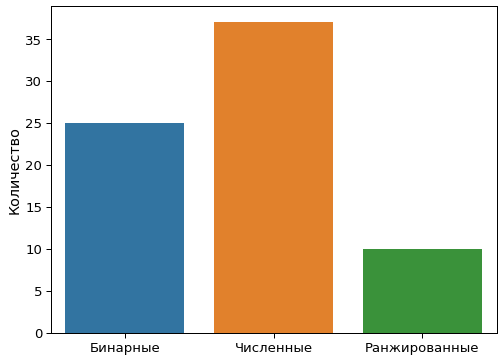

In [3]:
#ТОЛЬКО ДЛЯ КАРТИНКИ !!! РАСПРЕДЕЛЕНИЕ ТИПОВ ПРИЗНАКОВ
df = pd.read_csv('../_data/Tomsk-Almazov data ver 6.txt', sep='\t', header=0, names=headers, index_col=False, encoding='cp1251')
df = df.set_index("Пациент")

df = df.drop('Дата_операции', axis=1)
df = df.drop('Начало_периода', axis=1)
df = df.drop('Конец_периода', axis=1)

for col in df.columns:
    if (df[col].nunique() <= 5) &(df[col].nunique() > 2) & (df[col].dtype != object) & (col not in targets):
        df[col] = df[col].astype('category')
for col in df.columns:
    if (df[col].nunique() <= 2) & (df[col].dtype != object) & (col not in targets):
        df[col] = df[col].astype('boolean')
        
NUMERICAL = df.select_dtypes(exclude=['category','boolean']).columns.tolist()
CATEGORICAL = df.select_dtypes(include=['category']).columns.tolist()
BINARY = df.select_dtypes(include=['boolean']).columns.tolist()

x = ['Бинарные', 'Численные', 'Ранжированные']
y = [len(BINARY), len(NUMERICAL), len(CATEGORICAL)]
print(y)

sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(8,6))
ax = sns.barplot(x=x, y=y)
ax.set_ylabel('Количество')
plt.savefig('типы_признаков.png')

[5, 13, 4, 42]


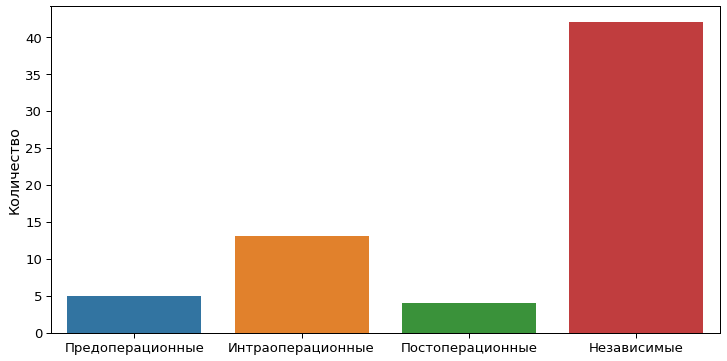

In [4]:
#ТОЛЬКО ДЛЯ КАРТИНКИ !!! РАСПРЕДЕЛЕНИЕ ТИПОВ ПРИЗНАКОВ ПО ВРЕМЕНИ
x = ['Предоперационные', 'Интраоперационные', 'Постоперационные', 'Независимые']
y = [5,13,4,42]
print(y)

sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(12,6))
ax = sns.barplot(x=x, y=y)
ax.set_ylabel('Количество')
plt.savefig('типы_признаков_по_времени.png')

In [5]:
#ЗАГРУЗКА ИНТЕГРИРОВАННЫХ ДАННЫХ
df = pd.read_csv('../_data/Tomsk-Almazov data ver 6.txt', sep='\t', header=0, names=headers, index_col=False, encoding='cp1251')
df = df.set_index("Пациент")
df.head()

,Дата_операции,Начало_периода,Конец_периода,Госпитальная_летальность,TND_Соматогенный_психоз,PND_Пароксизмальная_ночная_одышка,Продленное_ИВЛ,Заместительная_почечная_терапия,Кровотечение,Инфаркт_миокарда,...,Эрмасса,СЗП,Тромбоциты,Объем_кровопотери,Гемоглобин_опер,Гематокрит_опер,Креатинин_опер,АКШ,ПАК,ПМК
Пациент,,,,,,,,,,,,,,,,,,,,,
GACAAbN,NaN,20160510.0,20160531.0,0,0,0,0,0,0,0,...,0,0,0,280.0,105.0,30.0,NaN,1,1,0.0
GACACET,NaN,20120426.0,20120505.0,0,1,0,0,0,0,0,...,0,0,0,340.0,102.0,30.0,70.0,1,0,0.0
GACACuN,NaN,20161108.0,20161114.0,0,0,0,0,0,0,0,...,2,0,0,NaN,92.0,37.0,167.0,0,1,0.0
GACADLz,NaN,20130220.0,20130328.0,0,0,0,0,0,0,0,...,0,0,0,120.0,98.0,30.0,68.0,0,1,0.0
GACAFRq,NaN,20131225.0,20140203.0,0,0,0,0,0,0,0,...,0,0,0,400.0,100.0,30.0,76.0,0,1,1.0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 438 entries, GACAAbN to 97
Data columns (total 75 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Дата_операции                                  0 non-null      float64
 1   Начало_периода                                 341 non-null    float64
 2   Конец_периода                                  341 non-null    float64
 3   Госпитальная_летальность                       438 non-null    int64  
 4   TND_Соматогенный_психоз                        438 non-null    int64  
 5   PND_Пароксизмальная_ночная_одышка              438 non-null    int64  
 6   Продленное_ИВЛ                                 438 non-null    int64  
 7   Заместительная_почечная_терапия                438 non-null    int64  
 8   Кровотечение                                   438 non-null    int64  
 9   Инфаркт_миокарда                               438 non

In [7]:
df.describe()

,Дата_операции,Начало_периода,Конец_периода,Госпитальная_летальность,TND_Соматогенный_психоз,PND_Пароксизмальная_ночная_одышка,Продленное_ИВЛ,Заместительная_почечная_терапия,Кровотечение,Инфаркт_миокарда,...,Эрмасса,СЗП,Тромбоциты,Объем_кровопотери,Гемоглобин_опер,Гематокрит_опер,Креатинин_опер,АКШ,ПАК,ПМК
count,0.0,3.410000e+02,3.410000e+02,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,...,438.000000,438.000000,438.000000,417.000000,434.000000,426.000000,377.000000,438.000000,438.000000,341.000000
mean,NaN,2.015756e+07,2.015833e+07,0.095890,0.130137,0.109589,0.107306,0.063927,0.036530,0.013699,...,1.636986,2.299087,0.735160,399.916067,111.065207,29.385446,118.076393,0.278539,0.550228,0.058651
std,NaN,1.991146e+04,1.976725e+04,0.294778,0.336839,0.312734,0.309856,0.244902,0.187819,0.116370,...,3.575687,4.034128,1.737511,470.731509,19.975305,5.911522,62.355141,0.448793,0.498040,0.235316
min,NaN,2.010052e+07,2.010052e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,10.000000,67.000000,17.000000,12.000000,0.000000,0.000000,0.000000
25%,NaN,2.015012e+07,2.015023e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,200.000000,96.250000,27.000000,87.000000,0.000000,0.000000,0.000000
50%,NaN,2.016071e+07,2.016082e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,300.000000,108.000000,30.000000,107.000000,0.000000,1.000000,0.000000
75%,NaN,2.017093e+07,2.017112e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,4.000000,1.000000,450.000000,122.000000,30.000000,132.000000,1.000000,1.000000,0.000000
max,NaN,2.018113e+07,2.018113e+07,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,38.000000,32.000000,12.000000,4000.000000,176.500000,49.600000,877.000000,1.000000,1.000000,1.000000


In [8]:
nuls = df.isnull().mean().to_frame().sort_values(by=0, ascending = False)
nuls = nuls.reset_index()
nuls.columns = ['feature','%_nulls']
nuls['%_fulls'] = nuls['%_nulls'].apply(lambda x: 1 - x)
nuls.head(20)

,feature,%_nulls,%_fulls
0,Дата_операции,1.000000,0.000000
1,Гемоглобин_лаб,0.778539,0.221461
2,Сегмент_С,0.778539,0.221461
3,Сегмент_В,0.778539,0.221461
4,Сегмент_А,0.778539,0.221461
5,СКФ_лаб,0.778539,0.221461
6,Креатинин_лаб,0.778539,0.221461
7,Мочевина_лаб,0.778539,0.221461
8,Гематокрит_лаб,0.778539,0.221461
9,ЦА,0.534247,0.465753


<AxesSubplot:xlabel='%_fulls', ylabel='feature'>

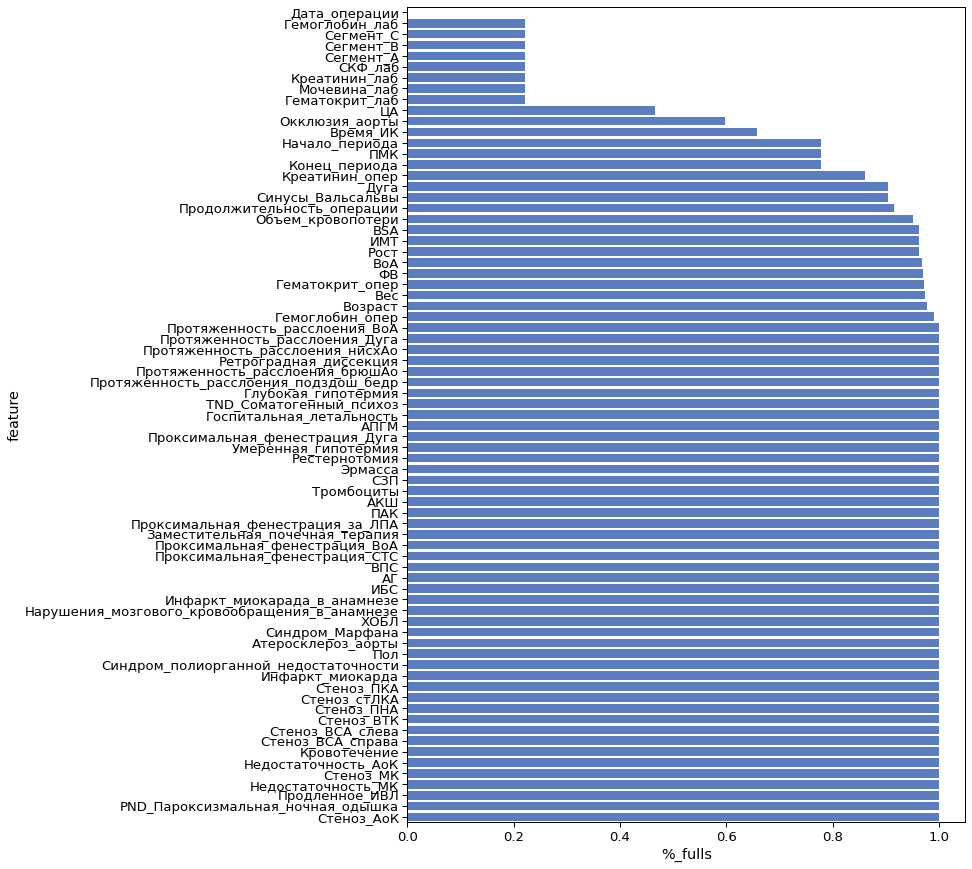

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

f, ax = plt.subplots(figsize=(10, 15))

sns.set_color_codes("muted")
sns.barplot(x="%_fulls", y='feature', data=nuls,
            label="Заполненные значения", color="b")


Удаляем признаки с большим количеством пропусков (>25%)

In [10]:
df = df.drop('Дата_операции', axis=1)
df = df.drop('Начало_периода', axis=1)
df = df.drop('Конец_периода', axis=1)
df = df.drop("Гемоглобин_лаб", axis=1)
df = df.drop("Гематокрит_лаб", axis=1)
df = df.drop("Мочевина_лаб", axis=1)
df = df.drop("Креатинин_лаб", axis=1)
df = df.drop("СКФ_лаб", axis=1)
df = df.drop("ЦА", axis=1)
df = df.drop("АПГМ", axis=1)
df = df.drop("Сегмент_В", axis=1)
df = df.drop("Сегмент_С", axis=1)
df = df.drop("Сегмент_А", axis=1)
df = df.drop("ПМК", axis=1)

Распределения признаков

In [11]:
for col in df.columns:
    if (df[col].nunique() <= 5) & (df[col].dtype != object) & (col not in targets):
        df[col] = df[col].astype('category')
        
NUMERICAL = df.select_dtypes(exclude=['category']).columns.tolist()
CATEGORICAL = df.select_dtypes(include=['category']).columns.tolist()
for tar in targets:
    if tar in NUMERICAL:
        NUMERICAL.remove(tar)
for tar in targets:
    if tar in CATEGORICAL:
        CATEGORICAL.remove(tar)

In [12]:
NUMERICAL

['Возраст',
 'Рост',
 'Вес',
 'ИМТ',
 'BSA',
 'ФВ',
 'Cинусы_Вальсальвы',
 'ВоА',
 'Дуга',
 'Время_ИК',
 'Окклюзия_аорты',
 'Продолжительность_операции',
 'Эрмасса',
 'СЗП',
 'Тромбоциты',
 'Объем_кровопотери',
 'Гемоглобин_опер',
 'Гематокрит_опер',
 'Креатинин_опер']

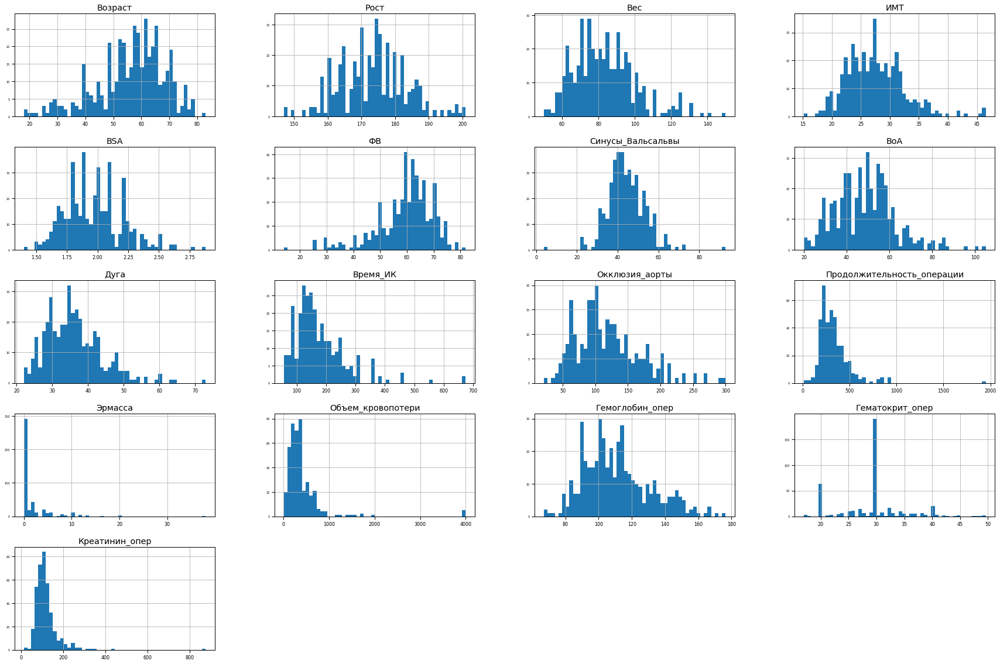

In [13]:
NUMERICAL.remove('СЗП')
NUMERICAL.remove('Тромбоциты')
df[NUMERICAL].hist(figsize=(30, 20), bins=50, xlabelsize=8, ylabelsize=5);

In [14]:
df = pd.get_dummies(df, prefix=CATEGORICAL, columns = CATEGORICAL, drop_first=True)

headers = df.columns.values.tolist()
headers = headers[len(targets):]

# Заполнение пропусков

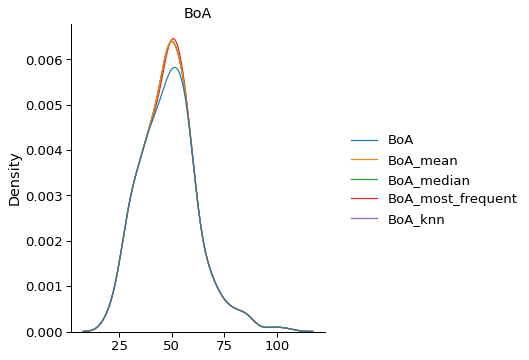

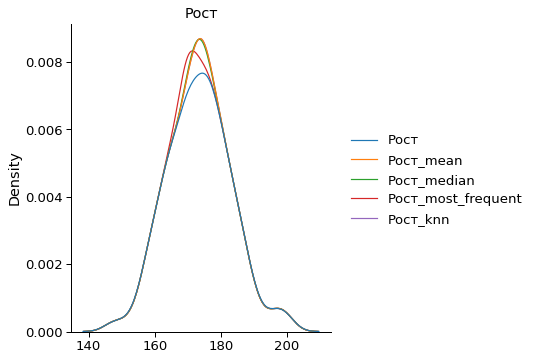

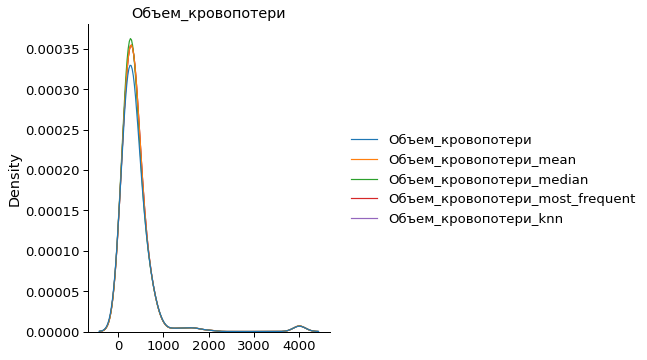

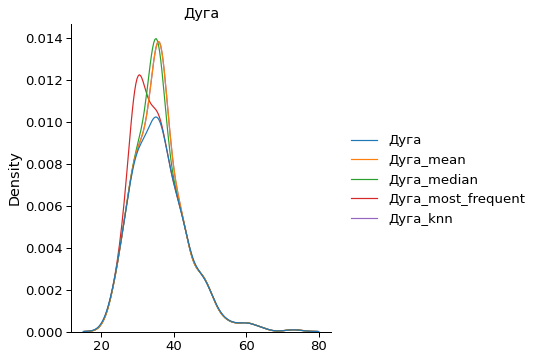

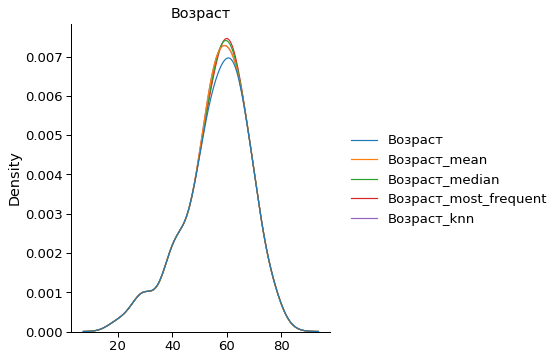

...

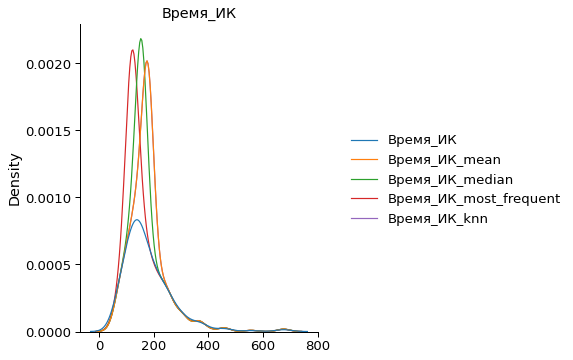

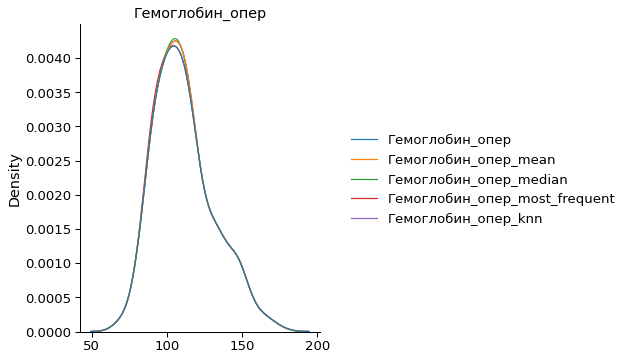

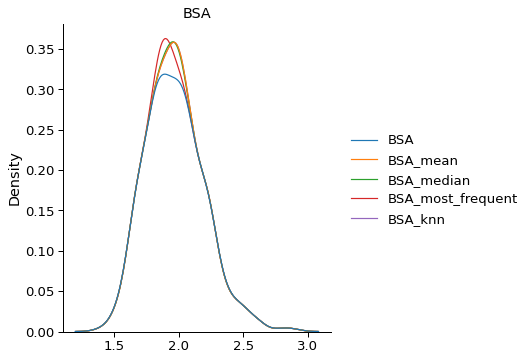

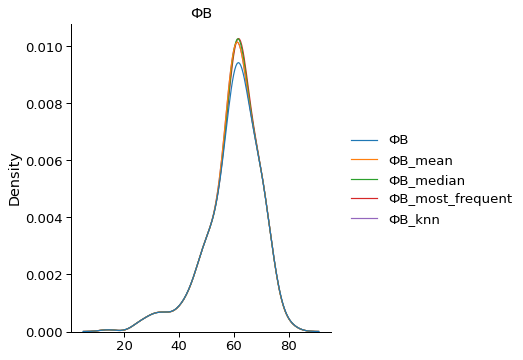

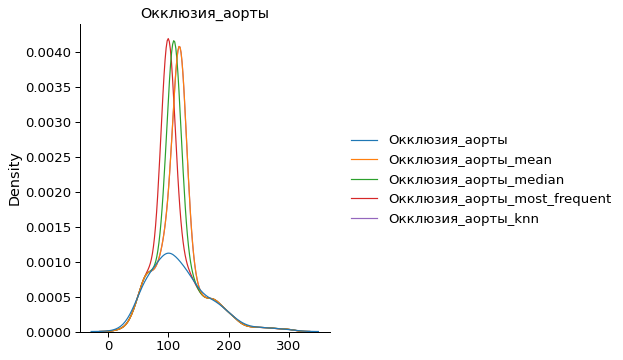

In [15]:
from imputers import simple_impute, knn_impute, knn_impute_final

cols = set(df.columns) - set(targets)
nan_cols=[col for col in cols if df[col].isnull().values.any()]
df_imp = df[nan_cols]

#Стратегия mean
mean_cols=[]
for col in nan_cols:
    df_imp, new_col = simple_impute(df_imp, col, 'mean')
    mean_cols.append(new_col)

#Стратегия median 
median_cols=[]
for col in nan_cols:
    df_imp, new_col = simple_impute(df_imp, col, 'median')
    median_cols.append(new_col)
    
#Стратегия freq 
freq_cols = []
for col in nan_cols:
    df_imp, new_col = simple_impute(df_imp, col, 'most_frequent')
    freq_cols.append(new_col)
    
#Стратегия knn 
knn_cols = []
for col in nan_cols:
    df_imp, new_col = knn_impute(df_imp, col)
    knn_cols.append(new_col)

from sklearn.metrics import mean_squared_error

for ind, item in enumerate(nan_cols):
    c=[item, mean_cols[ind],median_cols[ind],freq_cols[ind], knn_cols[ind]]
    sns.displot(df_imp[c], kind='kde')
    #plt.show()
    plt.title(str(item))
    #plt.legend('', )
    lgd=plt.legend('')
    lgd.set_visible(False)
    plt.savefig('заполнение_пропусков'+str(ind)+'.png')

Заполняем пропуски стратегией knn, т.к. она не меняет распределение признаков

In [16]:
#Стратегия knn
for col in nan_cols:
    knn_impute_final(df, col)

In [17]:
nuls = df.isnull().mean().to_frame().sort_values(by=0, ascending = False)
nuls = nuls.reset_index()
nuls.columns = ['feature','%_nulls']
nuls['%_fulls'] = nuls['%_nulls'].apply(lambda x: 1 - x)
nuls.head(10)

,feature,%_nulls,%_fulls
0,Госпитальная_летальность,0.0,1.0
1,Стеноз_ВСА_слева_3,0.0,1.0
2,Недостаточность_АоК_2,0.0,1.0
3,Недостаточность_АоК_1,0.0,1.0
4,Стеноз_АоК_3,0.0,1.0
5,Стеноз_АоК_2,0.0,1.0
6,Стеноз_АоК_1,0.0,1.0
7,Стеноз_ВСА_справа_3,0.0,1.0
8,Стеноз_ВСА_справа_2,0.0,1.0
9,Стеноз_ВСА_справа_1,0.0,1.0


Рассмотрим корелляцию признаков

<AxesSubplot:>

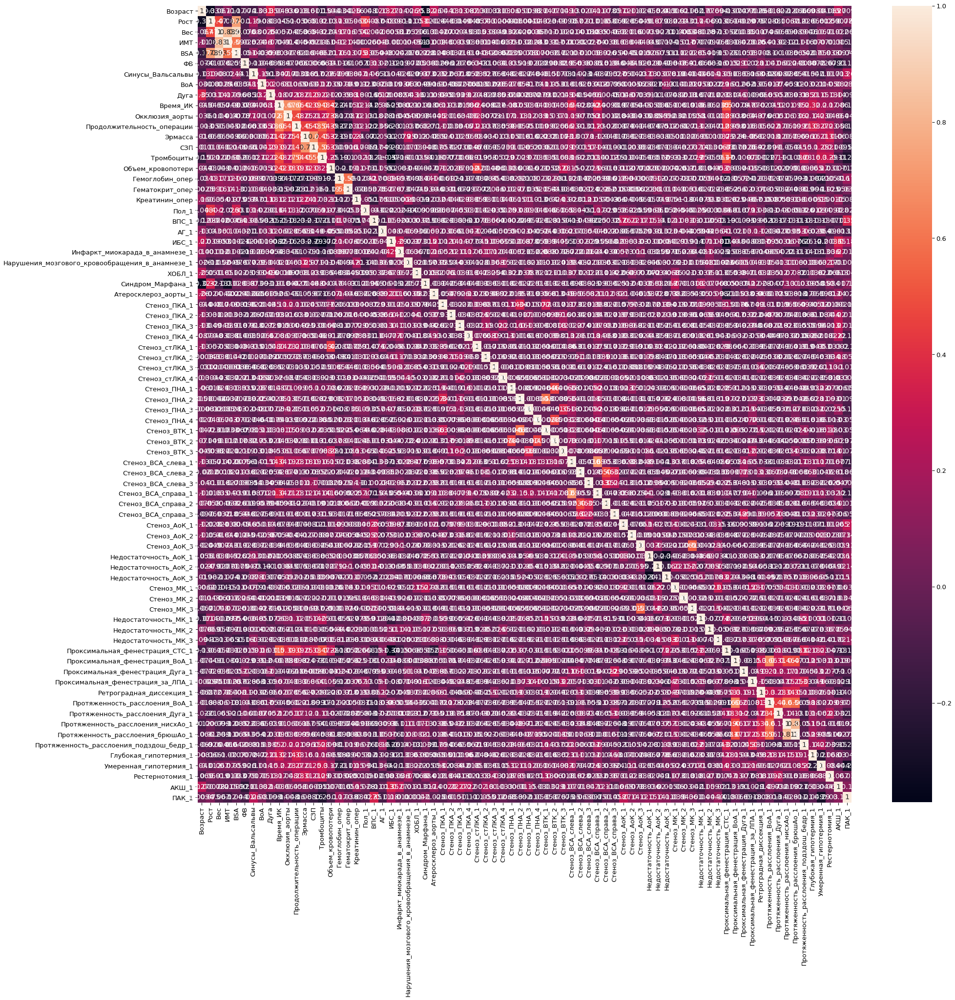

In [18]:
corr_matrix = df.loc[:,headers].corr(method='pearson', min_periods=50)
plt.figure(figsize=(30,30))
sns.heatmap(corr_matrix, annot=True)

In [19]:
pearson_corr = df.drop(targets, axis=1).corr(method='pearson', min_periods=50)
pos_corr = np.abs(np.nan_to_num(pearson_corr.values, 0.0))
strong_corr_pairs = []
for i in range(1, len(pos_corr)):
    if np.max(pos_corr[i, :i]) >= 0.5:
        j = np.argmax(pos_corr[i, :i])
        strong_corr_pairs.append((i, j, pearson_corr.values[i, j]))
cols = df.drop(targets, axis=1).columns
cols_dict = dict(list(zip(range(len(cols)), cols)))
strong_corr_df = pd.DataFrame(strong_corr_pairs).replace(cols_dict).sort_values(2, ascending=False)
strong_corr_df

,0,1,2
1,BSA,Вес,0.926244
0,ИМТ,Вес,0.830834
13,Протяженность_расслоения_брюшАо_1,Протяженность_расслоения_нисхАо_1,0.808853
4,СЗП,Эрмасса,0.696671
8,Стеноз_ВСА_справа_1,Стеноз_ВСА_слева_1,0.686981
2,Окклюзия_аорты,Время_ИК,0.668149
3,Продолжительность_операции,Время_ИК,0.660592
11,Протяженность_расслоения_ВоА_1,Проксимальная_фенестрация_ВоА_1,0.656475
12,Протяженность_расслоения_нисхАо_1,Протяженность_расслоения_ВоА_1,0.603429
6,Гематокрит_опер,Гемоглобин_опер,0.581318


Удаляем Вес, т.к. у него высокий коэффициент корелляции с двумя другими признаками

In [20]:
df = df.drop("Вес", axis=1)

In [21]:
#df.to_csv('../_data/Очищенные_данные Томск-Алмазов ver6.txt', sep='\t', encoding='cp1251')

Рассмотрим корелляцию целевых признаков

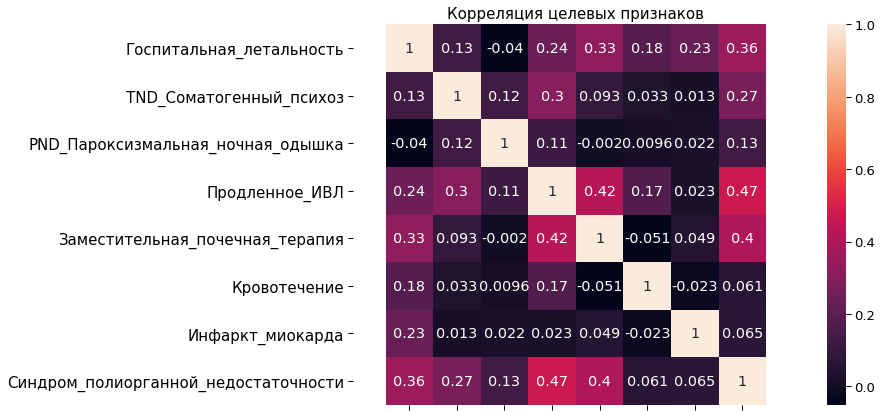

In [22]:
corr_matrix = df.loc[:,targets].corr(method='pearson', min_periods=50)
#print(corr_matrix)
plt.figure(figsize=(10,7))
g = sns.heatmap(corr_matrix, annot=True)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.title('Корреляция целевых признаков',fontsize=15)
plt.axis('equal')
g.set_xticklabels('', rotation=30)
plt.show()
#g.savefig('корреляция_целевых_признаков.png')

Отбор целевых признаков

In [23]:
#df = pd.read_csv('../_data/Очищенные_данные Томск-Алмазов ver6.txt', sep='\t', header=0, index_col=0, encoding='cp1251')
#df = df.drop("Время_ИК", axis=1)
#df = df.drop("Окклюзия_аорты", axis=1)

headers = df.columns.values.tolist()
headers = headers[len(targets):]

In [24]:
#Госпитальная_летальность
target_GL = targets[0]
headers_GL = df.columns.values.tolist()
headers_GL = headers_GL[1:]

#TND
target_TND = targets[1]
headers_TND = df.columns.values.tolist()
for t in targets:
    if (t != "Кровотечение") & (t != "Инфаркт_миокарда"):
        headers_TND.remove(t)
        
#PND
target_PND = targets[2]
headers_PND = df.columns.values.tolist()
for t in targets:
    if (t != "Кровотечение") & (t != "Инфаркт_миокарда")& (t != "TND_Соматогенный_психоз")& (t != "Продленное_ИВЛ")& (t != "Заместительная_почечная_терапия"):
        headers_PND.remove(t)
        
#Продленная_ИВЛ
target_IVL = targets[3]
headers_IVL = df.columns.values.tolist()
for t in targets:
    if (t == "Продленное_ИВЛ"):
        headers_IVL.remove(t)
headers_IVL = headers_IVL[1:]

#ЗПТ
target_ZPT = targets[4]
headers_ZPT = df.columns.values.tolist()
for t in targets:
    if (t == "Заместительная_почечная_терапия"):
        headers_ZPT.remove(t)
headers_ZPT = headers_ZPT[1:]

#Кровотечение
target_BLOOD = targets[5]
headers_BLOOD = df.columns.values.tolist()
headers_BLOOD = headers_BLOOD[8:]

#Инфаркт
target_IM = targets[6]
headers_IM = df.columns.values.tolist()
for t in targets:
    if (t != "Кровотечение"):
        headers_IM.remove(t)
        
#Синдром_полиорганной_недостаточности
target_SPN = targets[7]
headers_SPN = df.columns.values.tolist()
for t in targets:
    if (t != "Заместительная_почечная_терапия"):
        headers_SPN.remove(t)

Векторизация

In [25]:
from sklearn import preprocessing

x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_scaled = pd.DataFrame(x_scaled, columns=targets+headers)

# Госпитальная летальность

# Анализ важных признаков

In [26]:
from feature_importance import get_featureKBest, get_featureRFE, get_featureExtraTrees, get_featureLasso, feature_vote, feature_weights

Одномерный отбор признаков

Признаки, имеющие наиболее выраженную взаимосвязь с целевой переменной, могут быть отобраны с помощью статистических критериев. Библиотека scikit-learn содержит класс SelectKBest, реализующий одномерный отбор признаков (univariate feature selection).
Этот класс можно применять совместно с различными статистическими критериями для отбора заданного количества признаков.

В примере ниже используется критерий хи-квадрат (chi-squared test) для неотрицательных признаков,чтобы отобрать 4 лучших признака.

In [27]:
# Feature Extraction with Univariate Statistical Tests (Chi-squared for classification)
features_KBest = get_featureKBest(df_scaled, target_GL, headers_GL, 10)

Метод рекурсивного исключения признаков (recursive feature elimination, RFE) реализует следующий алгоритм:
- модель обучается на исходном наборе признаков и оценивает их значимость,
- затем исключается один или несколько наименее значимых признаков, модель обучается на оставшихся признаках,
- и так далее, пока не останется заданное количество лучших признаков.

В примере ниже метод RFE применяется в сочетании с логистической регрессией для отбора 3-х лучших признаков.
Для совместного использования с RFE можно выбирать различные модели, важно лишь чтобы они были достаточно эффективны и совместимы с RFE.

In [28]:
# Feature Extraction with RFE
features_RFE = get_featureRFE(df_scaled, target_GL, headers_GL, 10)

Отбор на основе важности признаков
Ансамблевые алгоритмы на основе деревьев решений, такие как случайный лес (random forest), также позволяют оценить важность признаков.

In [29]:
# Feature Importance with Extra Trees Classifier      
features_ET = get_featureExtraTrees(df_scaled, target_GL, headers_GL, 10)

In [30]:
features_L = get_featureLasso(df_scaled, target_GL, headers_GL, 10)

In [31]:
important_features_GL = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_GL

['Продленное_ИВЛ',
 'Заместительная_почечная_терапия',
 'Объем_кровопотери',
 'СЗП',
 'Синдром_полиорганной_недостаточности',
 'Стеноз_ВСА_справа_1',
 'Кровотечение',
 'Инфаркт_миокарда']

# Госпитальная летальность

# Моделирование

In [32]:
from vizualization import *
from evaluation import evaluate_model
from prediction import simple_pred, SMOTE_pred, NearMiss_pred

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss

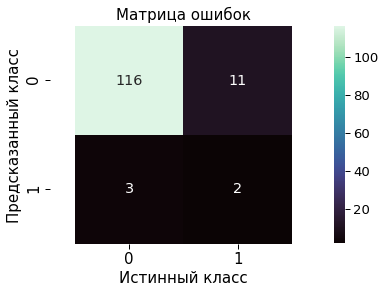

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.274159,0.634321,0.924837,0.123864,0.325669,0.564318,0.893939,0.222222,0.153846,0.4,0.854533,0.2


In [33]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_GL, target_GL, model)
vis_confusionMatrix(y_test, predictions)
errors

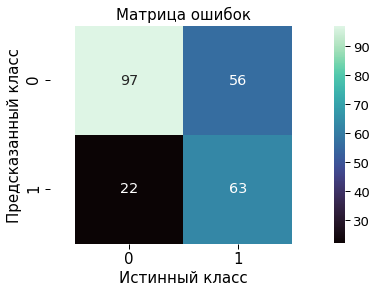

[('Синдром_полиорганной_недостаточности', 1.2070403568747587), ('Продленное_ИВЛ', 1.1384624540521886), ('Заместительная_почечная_терапия', 0.8540057706234078), ('Кровотечение', 0.5639322041606025), ('Стеноз_ВСА_справа_1', 0.1762503357090172), ('СЗП', 0.10929258825652002), ('Инфаркт_миокарда', 0.04467043729080278), ('Объем_кровопотери', 0.000862751287870409)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.568423,0.676895,0.676895,-0.292419,0.572478,0.672269,0.672269,0.617647,0.529412,0.741176,0.706731,0.616682


In [34]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df, important_features_GL, target_GL, model)
vis_confusionMatrix(y_test, predictions)
weights = feature_weights(df_scaled, model, important_features_GL, target_GL)
print(weights)
errors

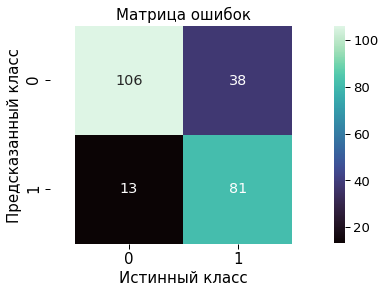

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.46541,0.783394,0.783394,0.133574,0.46291,0.785714,0.785714,0.760563,0.680672,0.861702,0.815296,0.718236


In [35]:
#Случайный лес со SMOTE
model = RandomForestClassifier(max_depth=4)
errors, predictions, y_test = SMOTE_pred(df, important_features_GL, target_GL, model)
vis_confusionMatrix(y_test, predictions)
errors

In [36]:
model = RandomForestClassifier(n_estimators=10, max_depth=4)
smote = SMOTE()
X, y = smote.fit_resample(df[important_features_GL], df[target_GL])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=51, stratify=y)
model.fit(X_train, y_train)
estimator = model.estimators_[5]
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                feature_names=X.columns,
                filled=True,
                rounded=True)
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
from sklearn import tree
tree.plot_tree(estimator,
               feature_names = important_features_GL, 
               class_names=target_GL,
               filled = True);
fig.savefig('rf_individualtree.png')

 XGBoost

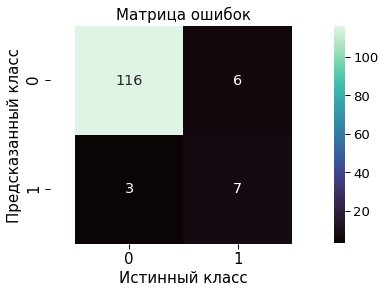

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.140028,0.896552,0.980392,0.771443,0.261116,0.756626,0.931818,0.608696,0.538462,0.7,0.878571,0.223333


In [37]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_GL, target_GL, model)
vis_confusionMatrix(y_test, predictions)
errors

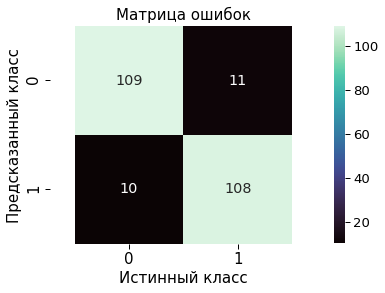

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.14091,0.980144,0.980144,0.920578,0.297044,0.911765,0.911765,0.911392,0.907563,0.915254,0.954562,0.915047


In [38]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_GL, target_GL, model)
vis_confusionMatrix(y_test, predictions)
errors

# TND_Соматогенный_психоз

In [39]:
features_KBest = get_featureKBest(df_scaled, target_TND, headers_TND, 10)
features_RFE = get_featureRFE(df_scaled, target_TND, headers_TND, 10)
features_ET = get_featureExtraTrees(df_scaled, target_TND, headers_TND, 10)
features_L = get_featureLasso(df_scaled, target_TND, headers_TND, 10)

important_features_TND = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_TND

['Проксимальная_фенестрация_СТС_1',
 'Нарушения_мозгового_кровообращения_в_анамнезе_1',
 'Ретроградная_диссекция_1',
 'Рестернотомия_1',
 'Протяженность_расслоения_брюшАо_1',
 'Протяженность_расслоения_ВоА_1',
 'Стеноз_ВСА_слева_2',
 'Протяженность_расслоения_нисхАо_1',
 'Эрмасса']

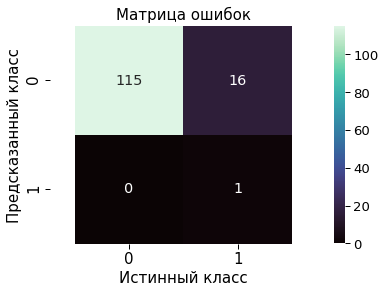

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.347728,0.54812,0.879085,-0.064098,0.348155,0.529412,0.878788,0.111111,0.058824,1.0,0.771841,0.125


In [40]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_TND, target_TND, model)
vis_confusionMatrix(y_test, predictions)
errors

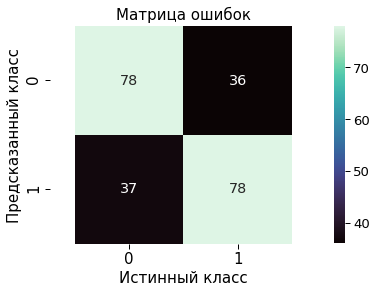

[('Проксимальная_фенестрация_СТС_1', 3.1317772528683676), ('Протяженность_расслоения_нисхАо_1', 1.4308672015697854), ('Стеноз_ВСА_слева_2', 0.8815601606701468), ('Протяженность_расслоения_ВоА_1', 0.5029625925739906), ('Рестернотомия_1', 0.37972877250257475), ('Эрмасса', 0.24909020918817387), ('Ретроградная_диссекция_1', 0.1792948912063467), ('Нарушения_мозгового_кровообращения_в_анамнезе_1', 0.14395542061167915), ('Протяженность_расслоения_брюшАо_1', 0.1277080904933822)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.553006,0.694229,0.694184,-0.223269,0.564604,0.681236,0.681223,0.681223,0.684211,0.678261,0.746302,0.675357


In [41]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df, important_features_TND, target_TND, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_TND, target_TND)
print(feat)
errors

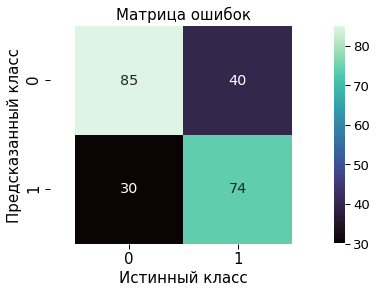

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.484274,0.765608,0.765478,0.06191,0.552881,0.694127,0.694323,0.678899,0.649123,0.711538,0.795002,0.709797


In [42]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_TND, target_TND, model)
vis_confusionMatrix(y_test, predictions)
errors

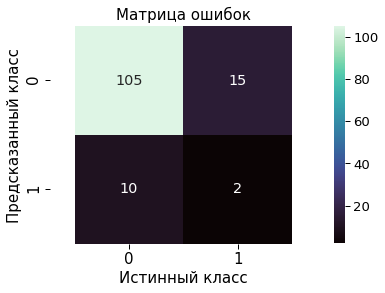

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.274159,0.72312,0.924837,0.338534,0.435194,0.515345,0.810606,0.137931,0.117647,0.166667,0.723214,0.201667


In [43]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_TND, target_TND, model)
vis_confusionMatrix(y_test, predictions)
errors

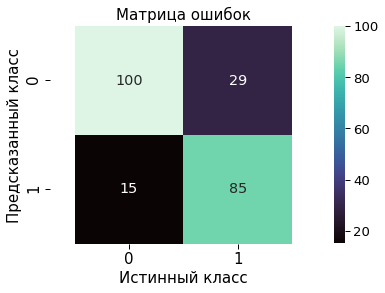

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.382546,0.853848,0.853659,0.414632,0.438337,0.80759,0.80786,0.794393,0.745614,0.85,0.854829,0.774154


In [44]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_TND, target_TND, model)
vis_confusionMatrix(y_test, predictions)
errors

# PND_Пароксизмальная_ночная_одышка

In [45]:
features_KBest = get_featureKBest(df_scaled, target_PND, headers_PND, 10)
features_RFE = get_featureRFE(df_scaled, target_PND, headers_PND, 10)
features_ET = get_featureExtraTrees(df_scaled, target_PND, headers_PND, 10)
features_L = get_featureLasso(df_scaled, target_PND, headers_PND, 10)

important_features_PND = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_PND

['Проксимальная_фенестрация_СТС_1',
 'Продленное_ИВЛ',
 'TND_Соматогенный_психоз',
 'Дуга',
 'Стеноз_ПКА_4',
 'АКШ_1',
 'Недостаточность_АоК_1',
 'Cинусы_Вальсальвы',
 'ПАК_1']

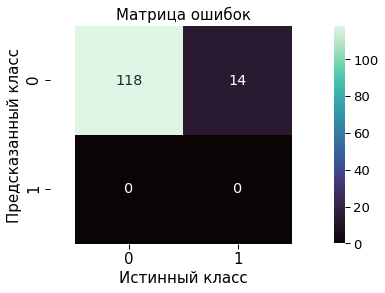

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.328395,0.514706,0.892157,-0.091912,0.325669,0.5,0.893939,0.0,0.0,0.0,0.67706,0.033333


In [46]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_PND, target_PND, model)
vis_confusionMatrix(y_test, predictions)
errors

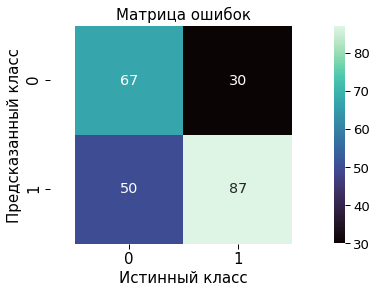

[('Cинусы_Вальсальвы', 2.329011850975408), ('Проксимальная_фенестрация_СТС_1', 2.2969943700831306), ('Дуга', 1.193528715953299), ('Стеноз_ПКА_4', 0.9382360616432218), ('Продленное_ИВЛ', 0.7484801675277699), ('ПАК_1', 0.7361527553138026), ('Недостаточность_АоК_1', 0.6118106926092828), ('АКШ_1', 0.3045952021249779), ('TND_Соматогенный_психоз', 0.15636204669245796)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.559631,0.686813,0.686813,-0.252747,0.584705,0.65812,0.65812,0.685039,0.74359,0.635036,0.735067,0.678547


In [47]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_PND, target_PND, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_PND, target_PND)
print(feat)
errors

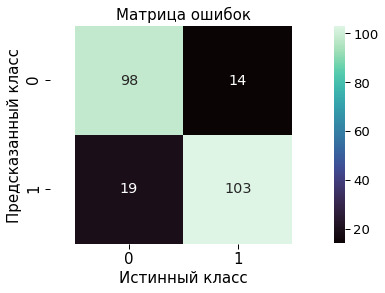

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.042796,0.998168,0.998168,0.992674,0.375534,0.858974,0.858974,0.861925,0.880342,0.844262,0.896291,0.821952


In [48]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_PND, target_PND, model)
vis_confusionMatrix(y_test, predictions)
errors

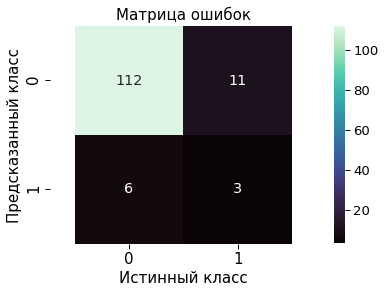

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.057166,0.985294,0.996732,0.966912,0.35887,0.581719,0.871212,0.26087,0.214286,0.333333,0.633379,0.17


In [49]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_PND, target_PND, model)
vis_confusionMatrix(y_test, predictions)
errors

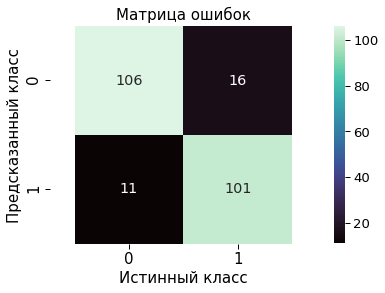

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.042796,0.998168,0.998168,0.992674,0.339683,0.884615,0.884615,0.882096,0.863248,0.901786,0.920683,0.834317


In [50]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_PND, target_PND, model)
vis_confusionMatrix(y_test, predictions)
errors

# Продленное_ИВЛ

In [51]:
features_KBest = get_featureKBest(df_scaled, target_IVL, headers_IVL, 10)
features_RFE = get_featureRFE(df_scaled, target_IVL, headers_IVL, 10)
features_ET = get_featureExtraTrees(df_scaled, target_IVL, headers_IVL, 10)
features_L = get_featureLasso(df_scaled, target_IVL, headers_IVL, 10)

important_features_IVL = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_IVL

['Стеноз_ВСА_слева_1',
 'Стеноз_ВСА_справа_1',
 'Синдром_полиорганной_недостаточности',
 'TND_Соматогенный_психоз',
 'Нарушения_мозгового_кровообращения_в_анамнезе_1',
 'Заместительная_почечная_терапия',
 'Кровотечение',
 'СЗП',
 'Эрмасса']

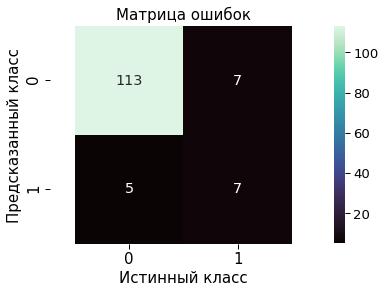

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.235702,0.782384,0.944444,0.422577,0.301511,0.728814,0.909091,0.538462,0.5,0.583333,0.937637,0.463333


In [52]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_IVL, target_IVL, model)
vis_confusionMatrix(y_test, predictions)
errors

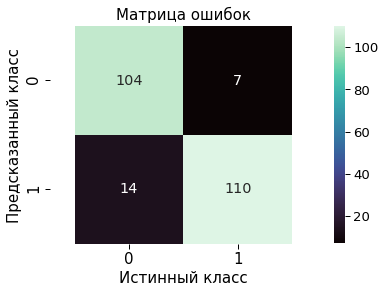

[('СЗП', 3.545231466248894), ('Эрмасса', 3.0611181563952856), ('Заместительная_почечная_терапия', 2.117892922038368), ('Стеноз_ВСА_слева_1', 1.862456407318865), ('Кровотечение', 1.8499112615960391), ('Синдром_полиорганной_недостаточности', 1.6541324424365385), ('TND_Соматогенный_психоз', 1.4055015122769319), ('Нарушения_мозгового_кровообращения_в_анамнезе_1', 0.3939890597374068), ('Стеноз_ВСА_справа_1', 0.14235932002373958)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.317094,0.899501,0.899452,0.597805,0.298934,0.910763,0.910638,0.912863,0.940171,0.887097,0.953513,0.885714


In [53]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_IVL, target_IVL, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_IVL, target_IVL)
print(feat)
errors

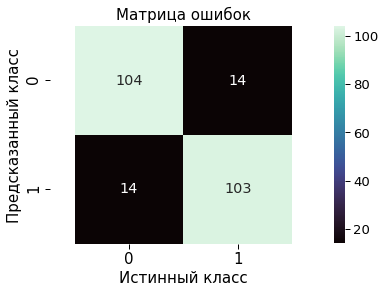

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.24562,0.939707,0.939671,0.758683,0.34518,0.880849,0.880851,0.880342,0.880342,0.880342,0.941503,0.875245


In [54]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_IVL, target_IVL, model)
vis_confusionMatrix(y_test, predictions)
errors

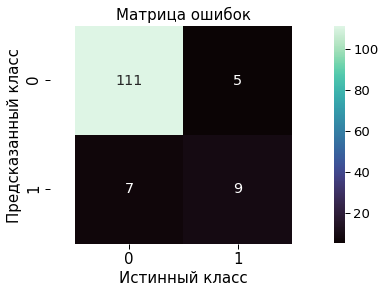

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.114332,0.966034,0.986928,0.864136,0.301511,0.791768,0.909091,0.6,0.642857,0.5625,0.956387,0.56


In [55]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_IVL, target_IVL, model)
vis_confusionMatrix(y_test, predictions)
errors

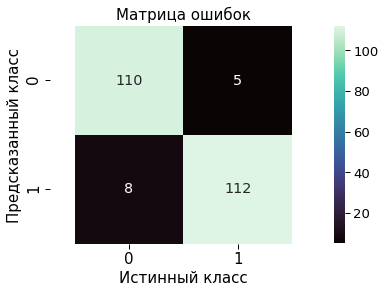

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.074057,0.994519,0.994516,0.978062,0.2352,0.944734,0.944681,0.945148,0.957265,0.933333,0.987402,0.945281


In [56]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_IVL, target_IVL, model)
vis_confusionMatrix(y_test, predictions)
errors

# Заместительная_почечная_терапия

In [57]:
features_KBest = get_featureKBest(df_scaled, target_ZPT, headers_ZPT, 10)
features_RFE = get_featureRFE(df_scaled, target_ZPT, headers_ZPT, 10)
features_ET = get_featureExtraTrees(df_scaled, target_ZPT, headers_ZPT, 10)
features_L = get_featureLasso(df_scaled, target_ZPT, headers_ZPT, 10)

important_features_ZPT = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_ZPT

['Продленное_ИВЛ',
 'Проксимальная_фенестрация_за_ЛПА_1',
 'Протяженность_расслоения_подздош_бедр_1',
 'СЗП',
 'Синдром_полиорганной_недостаточности',
 'Стеноз_ВСА_справа_1',
 'Стеноз_ВСА_слева_1',
 'Умеренная_гипотермия_1']

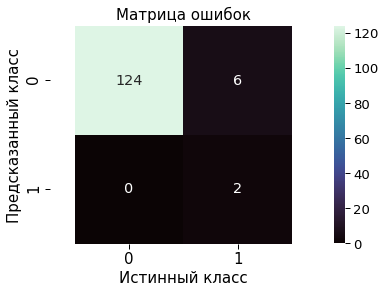

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.228665,0.646503,0.947712,0.144056,0.213201,0.625,0.954545,0.4,0.25,1.0,0.918214,0.2


In [58]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_ZPT, target_ZPT, model)
vis_confusionMatrix(y_test, predictions)
errors

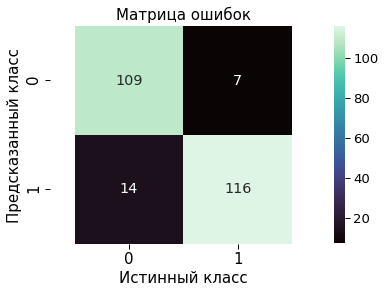

[('Синдром_полиорганной_недостаточности', 3.239349980570861), ('Протяженность_расслоения_подздош_бедр_1', 2.192813254605331), ('Умеренная_гипотермия_1', 1.508773936137286), ('Стеноз_ВСА_слева_1', 1.482911624820938), ('Продленное_ИВЛ', 1.3662690483178348), ('СЗП', 1.0946403203347794), ('Стеноз_ВСА_справа_1', 0.6846903908046829), ('Проксимальная_фенестрация_за_ЛПА_1', 0.19491484949792795)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.298077,0.91115,0.91115,0.644599,0.292174,0.914634,0.914634,0.916996,0.943089,0.892308,0.944337,0.902888


In [59]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_ZPT, target_ZPT, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_ZPT, target_ZPT)
print(feat)
errors

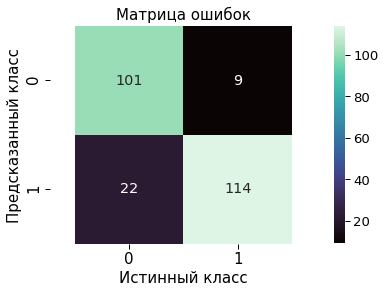

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.270501,0.926829,0.926829,0.707317,0.354988,0.873984,0.873984,0.880309,0.926829,0.838235,0.948622,0.880955


In [60]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_ZPT, target_ZPT, model)
vis_confusionMatrix(y_test, predictions)
errors

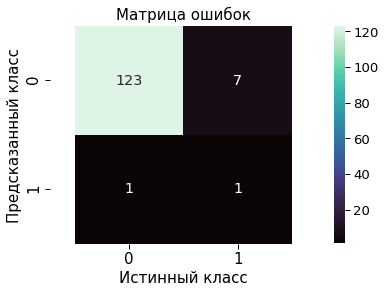

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.140028,0.85,0.980392,0.679021,0.246183,0.558468,0.939394,0.2,0.125,0.5,0.884643,0.25


In [61]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_ZPT, target_ZPT, model)
vis_confusionMatrix(y_test, predictions)
errors

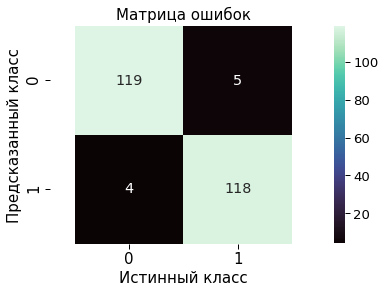

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.093332,0.991289,0.991289,0.965157,0.191273,0.963415,0.963415,0.963265,0.95935,0.967213,0.987211,0.955563


In [62]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_ZPT, target_ZPT, model)
vis_confusionMatrix(y_test, predictions)
errors

# Кровотечение

In [63]:
features_KBest = get_featureKBest(df_scaled, target_BLOOD, headers_BLOOD, 10)
features_RFE = get_featureRFE(df_scaled, target_BLOOD, headers_BLOOD, 10)
features_ET = get_featureExtraTrees(df_scaled, target_BLOOD, headers_BLOOD, 10)
features_L = get_featureLasso(df_scaled, target_BLOOD, headers_BLOOD, 10)

important_features_BLOOD = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_BLOOD


['Ретроградная_диссекция_1',
 'Рост',
 'СЗП',
 'Инфаркт_миокарада_в_анамнезе_1',
 'ПАК_1',
 'Тромбоциты',
 'Синдром_Марфана_1',
 'BSA']

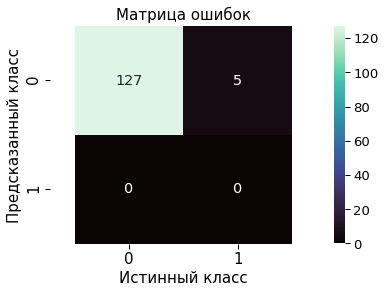

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.189599,0.5,0.964052,-0.037288,0.194625,0.5,0.962121,0.0,0.0,0.0,NaN,NaN


In [64]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_BLOOD, target_BLOOD, model)
vis_confusionMatrix(y_test, predictions)
errors

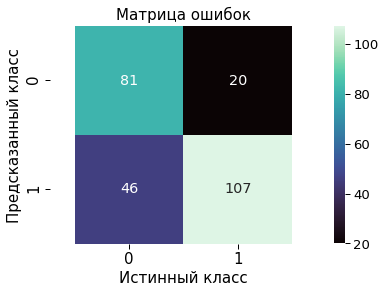

[('BSA', 3.8956809974688387), ('Инфаркт_миокарада_в_анамнезе_1', 3.2212108517382623), ('ПАК_1', 1.7129230978000072), ('СЗП', 1.6122416340794654), ('Рост', 1.3895067704006532), ('Ретроградная_диссекция_1', 0.6678340204238172), ('Синдром_Марфана_1', 0.16035018605875687), ('Тромбоциты', 0.04428450643912656)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.433746,0.811864,0.811864,0.247458,0.509748,0.740157,0.740157,0.764286,0.84252,0.699346,0.886976,0.819084


In [65]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_BLOOD, target_BLOOD, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_BLOOD, target_BLOOD)
print(feat)
errors

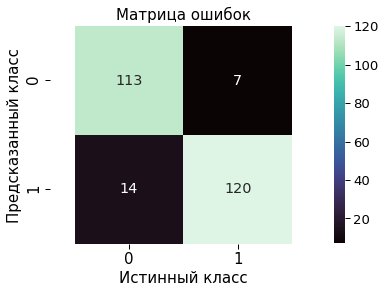

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.082339,0.99322,0.99322,0.972881,0.287536,0.917323,0.917323,0.91954,0.944882,0.895522,0.98204,0.942808


In [66]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_BLOOD, target_BLOOD, model)
vis_confusionMatrix(y_test, predictions)
errors

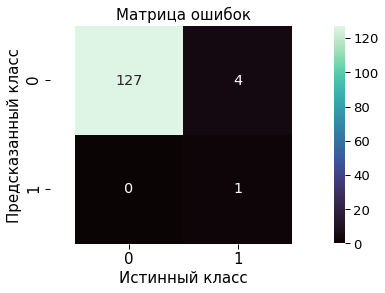

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.099015,0.863636,0.990196,0.717103,0.174078,0.6,0.969697,0.333333,0.2,1.0,NaN,NaN


In [67]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_BLOOD, target_BLOOD, model)
vis_confusionMatrix(y_test, predictions)
errors

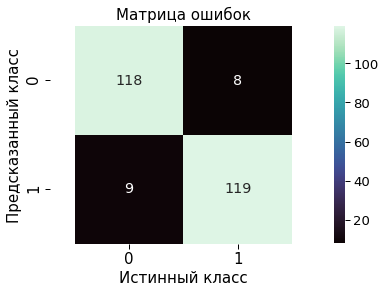

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.058222,0.99661,0.99661,0.986441,0.258707,0.933071,0.933071,0.933333,0.937008,0.929688,0.991373,0.955996


In [68]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_BLOOD, target_BLOOD, model)
vis_confusionMatrix(y_test, predictions)
errors

# Инфаркт_миокарда

In [69]:
features_KBest = get_featureKBest(df_scaled, target_IM, headers_IM, 10)
features_RFE = get_featureRFE(df_scaled, target_IM, headers_IM, 10)
features_ET = get_featureExtraTrees(df_scaled, target_IM, headers_IM, 10)
features_L = get_featureLasso(df_scaled, target_IM, headers_IM, 10)

important_features_IM = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_IM

['Стеноз_ВСА_справа_1',
 'Протяженность_расслоения_брюшАо_1',
 'Эрмасса',
 'Проксимальная_фенестрация_СТС_1',
 'Время_ИК',
 'Недостаточность_АоК_1',
 'Стеноз_стЛКА_1',
 'Стеноз_стЛКА_3',
 'Объем_кровопотери']

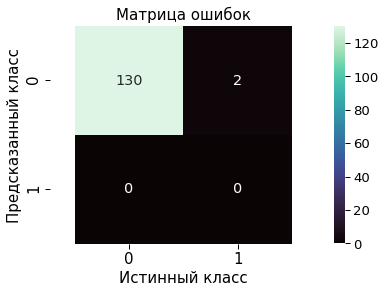

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.114332,0.5,0.986928,-0.013245,0.123091,0.5,0.984848,0.0,0.0,0.0,NaN,NaN


In [70]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_IM, target_IM, model)
vis_confusionMatrix(y_test, predictions)
errors

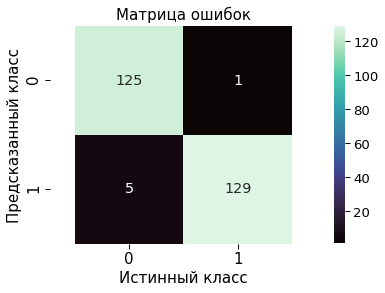

[('Стеноз_стЛКА_3', 4.652145849767675), ('Эрмасса', 4.455832107085784), ('Протяженность_расслоения_брюшАо_1', 2.789597808923929), ('Объем_кровопотери', 2.784599983976249), ('Стеноз_стЛКА_1', 1.9377819900684388), ('Недостаточность_АоК_1', 1.216777944180875), ('Время_ИК', 1.0638202655054405), ('Проксимальная_фенестрация_СТС_1', 0.8637488546088576), ('Стеноз_ВСА_справа_1', 0.8240408954776508)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.134952,0.981788,0.981788,0.927152,0.151911,0.976923,0.976923,0.977273,0.992308,0.962687,0.990736,0.976593


In [71]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_IM, target_IM, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_IM, target_IM)
print(feat)
errors

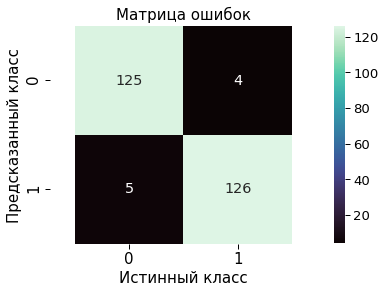

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.0,1.0,1.0,1.0,0.186052,0.965385,0.965385,0.965517,0.969231,0.961832,0.992826,0.965176


In [72]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_IM, target_IM, model)
vis_confusionMatrix(y_test, predictions)
errors

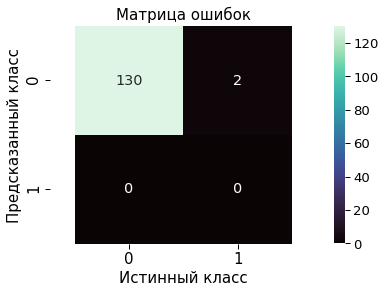

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.057166,0.875,0.996732,0.746689,0.123091,0.5,0.984848,0.0,0.0,0.0,NaN,NaN


In [73]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_IM, target_IM, model)
vis_confusionMatrix(y_test, predictions)
errors

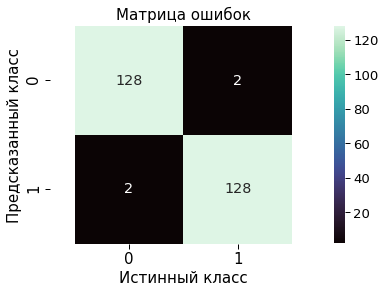

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.0,1.0,1.0,1.0,0.124035,0.984615,0.984615,0.984615,0.984615,0.984615,0.997333,0.990108


In [74]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_IM, target_IM, model)
vis_confusionMatrix(y_test, predictions)
errors

# Синдром_полиорганной_недостаточности

In [75]:
features_KBest = get_featureKBest(df_scaled, target_SPN, headers_SPN, 10)
features_RFE = get_featureRFE(df_scaled, target_SPN, headers_SPN, 10)
features_ET = get_featureExtraTrees(df_scaled, target_SPN, headers_SPN, 10)
features_L = get_featureLasso(df_scaled, target_SPN, headers_SPN, 10)

important_features_SPN = feature_vote(features_KBest, features_RFE, features_ET, features_L)
important_features_SPN

['Нарушения_мозгового_кровообращения_в_анамнезе_1',
 'Глубокая_гипотермия_1',
 'Заместительная_почечная_терапия',
 'Протяженность_расслоения_брюшАо_1',
 'Стеноз_ПКА_4',
 'Протяженность_расслоения_ВоА_1',
 'СЗП',
 'Возраст',
 'АКШ_1',
 'ПАК_1',
 'Эрмасса']

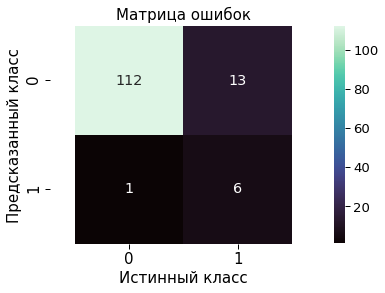

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.328395,0.645459,0.892157,0.107083,0.325669,0.65347,0.893939,0.461538,0.315789,0.857143,0.780266,0.353333


In [76]:
#Логистическая регрессия 
model = LogisticRegression()
errors, predictions, y_test = simple_pred(df_scaled, important_features_SPN, target_SPN, model)
vis_confusionMatrix(y_test, predictions)
errors

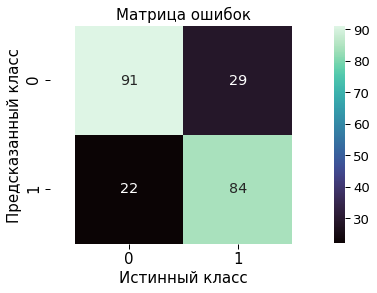

[('Заместительная_почечная_терапия', 2.00739257574365), ('Возраст', 1.9441664908225054), ('Эрмасса', 1.7021852184380961), ('Стеноз_ПКА_4', 1.5719869771244892), ('СЗП', 1.4880574576905696), ('Протяженность_расслоения_ВоА_1', 0.7513975834094098), ('ПАК_1', 0.7133363395970049), ('Нарушения_мозгового_кровообращения_в_анамнезе_1', 0.5534997109541222), ('Глубокая_гипотермия_1', 0.5228666978275721), ('Протяженность_расслоения_брюшАо_1', 0.3072497443382017), ('АКШ_1', 0.05106892928577871)]


,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.526846,0.722433,0.722433,-0.110266,0.475041,0.774336,0.774336,0.767123,0.743363,0.792453,0.795224,0.704688


In [77]:
#Логистическая регрессия со SMOTE
model = LogisticRegression()
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_SPN, target_SPN, model)
vis_confusionMatrix(y_test, predictions)
feat=feature_weights(df_scaled, model, important_features_SPN, target_SPN)
print(feat)
errors

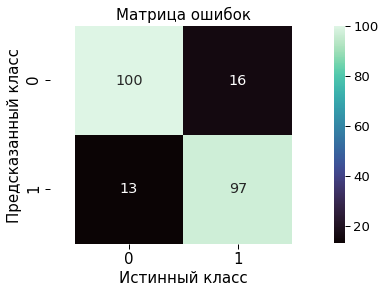

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.106803,0.988593,0.988593,0.954373,0.358216,0.871681,0.871681,0.869955,0.858407,0.881818,0.896154,0.813448


In [78]:
#Случайный лес со SMOTE
model = RandomForestClassifier()
errors, predictions, y_test = SMOTE_pred(df, important_features_SPN, target_SPN, model)
vis_confusionMatrix(y_test, predictions)
errors

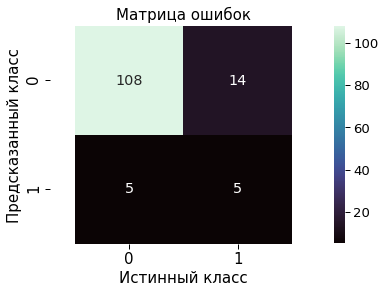

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.127827,0.94186,0.98366,0.86471,0.379393,0.609455,0.856061,0.344828,0.263158,0.5,0.65174,0.320238


In [79]:
#XGBoost
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = simple_pred(df_scaled, important_features_SPN, target_SPN, model)
vis_confusionMatrix(y_test, predictions)
errors

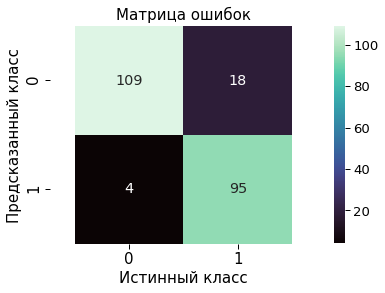

,train_MSE,train_ROC_AUC,train_accuracy,train_f-score,MSE,ROC_AUC,accuracy,f-score,recall,precision,crossval_ROC_AUC-mean,crossval_f-score-mean
0,0.097497,0.990494,0.990494,0.961977,0.312002,0.902655,0.902655,0.896226,0.840708,0.959596,0.943301,0.875798


In [80]:
#XGBoost со SMOTE
model = xgboost.XGBClassifier(verbosity=0)
errors, predictions, y_test = SMOTE_pred(df_scaled, important_features_SPN, target_SPN, model)
vis_confusionMatrix(y_test, predictions)
errors